<a href="https://colab.research.google.com/github/imad3k/Charlotte-311-Project/blob/main/Charlotte311.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src='https://www.commonapp.org/static/90a1fb37e395b1adc32f28236052d416/university-north-carolina-charlotte_959.jpg'>



## PROJECT: Charlotte 311 Service Requests
## DSBA 6162


**Charlotte 311 Calls** has been dowloaded from the [Charlotte Open Data portal](https://data.charlottenc.gov/datasets/service-requests-311/explore)

In this notebook, I will be importing the above data and GIS map data from my Google Drive. **GIS and Census data** come from the [Census Reporter](https://censusreporter.org/) website.

**Other data and GIS resources:**


1.   [Open Maps](http://maps.co.mecklenburg.nc.us/openmapping/data.html)
2.   [Census Blocks](https://www.census.gov/newsroom/blogs/random-samplings/2011/07/what-are-census-blocks.html)
3. [Geopandas in CoLab](https://colab.research.google.com/github/shakasom/GDS/blob/master/Part1%20-%20Introduction.ipynb#scrollTo=6pMKuuyNMnwv)
4. [Medium Article](https://ecyy.medium.com/mapping-gis-data-on-a-basemap-by-contextily-in-colab-dfff5837eec): Using GIS data in python
5. [UCLA Workshop on GeoPandas](https://github.com/yohman/getting-started-with-gis)








In [64]:
# Import Numpy
import numpy as np

# Import Pandas
import pandas as pd

# Import Random
import random

# to read and visualize spatial data
! pip install geopandas
import geopandas as gpd

! pip install contextily
import contextily as ctx

! pip install descartes
import descartes

# For spatial statistics
! pip install -U esda
import esda 
from esda.moran import Moran, Moran_Local

! pip install -U pysal
import splot 
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# to add the geometry use:
from shapely.geometry import Point, Polygon


# to give more power to your figures (plots)
import matplotlib.pyplot as plt

# Import Seaborn for plotting
import seaborn as sns

{
    "tags": [
        "hide-output"
    ]
}

{'tags': ['hide-output']}

### 1) Importing the data file from Google drive.

In [2]:
# Import Data

from google.colab import drive
drive.mount('/content/gdrive')



Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
df = pd.read_csv('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/Service_Requests_311.csv')


### 2) Taking a look at the our data

In [4]:
# Taking a look at the data
df.head()

,X,Y,OBJECTID,DEPARTMENT,DIVISION,REQUEST_NO,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,TITLE,CMPD_DIVISION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,STREET_DIRECTION,STREET_NAME,STREET_TYPE,CITY,STATE,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,COUNCIL_DISTRICT,GlobalID,PID,Shape
0,1.458251e+06,508075.000119,1,Solid Waste Services,Sanitation,6402056,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:25:00+00,N,NON_RECYCLABLE ITEMS,NaN,215.0,3601.0,NaN,KNAPDALE,LN,CHARLOTTE,NC,28226.0,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",1458251.0,508075.0,35.132444,-80.812089,NaN,{35439C7B-D8E4-4296-9119-8673B1D5A7C8},20904304,NaN
1,1.468687e+06,587225.999953,2,Housing and NBHD Serv,311 Partner Liaison,6402064,2017,05-Nov,UTILITY VERIFICATION LTR,2016/11/07 14:28:00+00,N,UTILITY VERIFICATION LTR,NaN,265.0,4124.0,NaN,SILVERMERE,WY,CHARLOTTE,NC,28269.0,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",1468687.0,587226.0,35.350408,-80.781941,NaN,{3B4A2DC0-8886-4E8E-95E6-4F426C4E08E2},02731251,NaN
2,1.471481e+06,562512.999839,3,Solid Waste Services,Sanitation,6402082,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:34:00+00,N,Non-recyclable Items,NaN,103.0,523.0,NaN,GRAHAM MEADOW,DR,CHARLOTTE,NC,28213.0,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",1471481.0,562513.0,35.282654,-80.771094,NaN,{C3E4CF76-7630-4356-8216-428445A0903F},08917486,NaN
3,1.438992e+06,568604.000124,4,Solid Waste Services,Sanitation,6402103,2017,05-Nov,MISSED RECYCLING,2016/11/07 14:41:00+00,N,MISSED RECYCLING,NaN,158.0,1801.0,NaN,CRANDON,DR,CHARLOTTE,NC,28216.0,"1801 CRANDON DR, CHARLOTTE, NC 28216",1438992.0,568604.0,35.297745,-80.880327,NaN,{FC3B4CD8-1131-42B4-A37E-8CA448855B24},03925515,NaN
4,NaN,NaN,5,Transit,Transit/Operations,6402111,2017,05-Nov,CITIZEN FEEDBACK,2016/11/07 14:44:00+00,N,CITIZEN FEEDBACK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,{E0166346-2381-40E1-80A0-2ECA4FB6CB27},NaN,NaN


In [5]:
# More exploration
# Lets take a look at how each variable is stored
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1631510 entries, 0 to 1631509
Data columns (total 30 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   X                           1559084 non-null  float64
 1   Y                           1559084 non-null  float64
 2   OBJECTID                    1631510 non-null  int64  
 3   DEPARTMENT                  1631510 non-null  object 
 4   DIVISION                    1623095 non-null  object 
 5   REQUEST_NO                  1631510 non-null  int64  
 6   FISCAL_YEAR                 1631510 non-null  int64  
 7   FISCAL_MONTH                1631510 non-null  object 
 8   REQUEST_TYPE                1631510 non-null  object 
 9   RECEIVED_DATE               1631510 non-null  object 
 10  INTERNAL_FIELD_OBSERVATION  1631510 non-null  object 
 11  TITLE                       1631510 non-null  object 
 12  CMPD_DIVISION               45672 non-null    object 
 1

In [6]:
df.isna().sum()

X                               72426
Y                               72426
OBJECTID                            0
DEPARTMENT                          0
DIVISION                         8415
REQUEST_NO                          0
FISCAL_YEAR                         0
FISCAL_MONTH                        0
REQUEST_TYPE                        0
RECEIVED_DATE                       0
INTERNAL_FIELD_OBSERVATION          0
TITLE                               0
CMPD_DIVISION                 1585838
NEIGHBORHOOD_PROFILE_AREA       72448
BLOCK_NO                        44353
STREET_DIRECTION              1575403
STREET_NAME                      7168
STREET_TYPE                     13241
CITY                             7168
STATE                            7168
ZIP_CODE                        45083
FULL_ADDRESS                     7168
X_COORD                         72426
Y_COORD                         72426
LATITUDE                        72433
LONGITUDE                       72433
COUNCIL_DIST

In [7]:
# Lets check the Value Counts for 311 Requests
df['REQUEST_TYPE'].value_counts().head(30).sort_values(ascending=False)

NON_RECYCLABLE ITEMS         831737
RECYCLABLE ITEMS             199452
HNS HEALTH AND SANITATION     85031
CART REPAIR-GARBAGE           36541
MISSED RECYCLING              27471
SW DOCUMENT GARBAGE           26729
311 DOCUMENT                  25395
CDOT STREETLIGHT REPAIR       19216
SW DOCUMENT RECYCLING         17932
DEAD ANIMAL COLLECTION        16727
CART ISSUE/MISSING CART       15121
TIRES                         13577
SW DOCUMENT YARD WASTE        13186
CART DELIVERY RECYCLING       11835
COMPLAINT                     11788
ZONING/COMPLAINT/ INSPECT     11767
CART(S) DEL- NEW BUILD        11324
CART ONLY DELIVER-GARB        11235
CART REPAIR-RECYCLE            9933
ZON GENERAL INFO  INQUIRY      9805
CDOT POTHOLE REPAIR            9416
HNS HOUSING                    8405
CART PURCHASE 2ND-GARBAGE      8077
MISSED GARBAGE                 7330
CDOT STREET SIGN REP/REPL      7260
PARKING ON LAWN WORKDAYS       6956
STREET SWEEPING/FLUSHING       6824
GRAFFITI                    

In [8]:
# Checking the full list of Request Types
df['REQUEST_TYPE'].unique().tolist()

['NON_RECYCLABLE ITEMS',
 'UTILITY VERIFICATION LTR',
 'MISSED RECYCLING',
 'CITIZEN FEEDBACK',
 'CWP REQUEST',
 'RECYCLABLE ITEMS',
 'CART REPAIR-GARBAGE',
 '311 DOCUMENT',
 'HNS HEALTH AND SANITATION',
 'ZON DAYCARE/CHILDCARE INQ',
 'CDOT STREETLIGHT REPAIR',
 'ZON SIGNS INQUIRY',
 'CART ISSUE/MISSING CART',
 'CART(S) DEL- NEW BUILD',
 'CART REPAIR-RECYCLE',
 'CDOT STREET SIGN REP/REPL',
 'SW DOCUMENT BULKY ITEMS',
 'TIRES',
 'LANDSCAPE TREES',
 'CART DELIVERY RECYCLING',
 'TAX BILL INQUIRY',
 'CART PURCHASE 2ND-GARBAGE',
 'FIELD OBSERVED PROBLEM',
 'SW DOCUMENT YARD WASTE',
 'LITTER/DEBRIS IN STREET',
 'SWS CART SHIPMT REVIEW',
 'ZONGROUP/BOARDING HOMES',
 'INVALID/NEW SW ADDRESS',
 'FLOODING',
 'SW DOCUMENT GARBAGE',
 'DEAD ANIMAL COLLECTION',
 'SW DOCUMENT RECYCLING',
 'ZON RESIDENTIAL PERMITS',
 'INVESTIGATE/CONTACT RECY',
 'HNS HOUSING',
 'CART ONLY DELIVER-GARB',
 'CART PURCHASE 2ND-RECYCLE',
 'CDOT TRAF SIGNAL TIMING',
 'CART PICKUP-RECYCLE',
 '3-1-1 ESCALATION REQUEST',
 'CDO

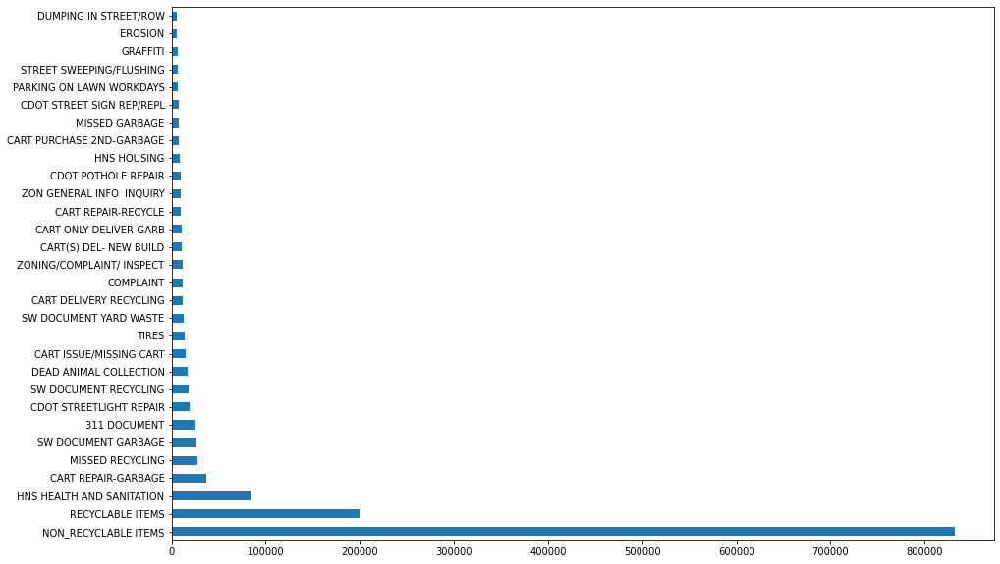

In [9]:
# Create barplot of the top 30 Request types
df['REQUEST_TYPE'].value_counts().head(30).plot(kind='barh', figsize=(15,10))

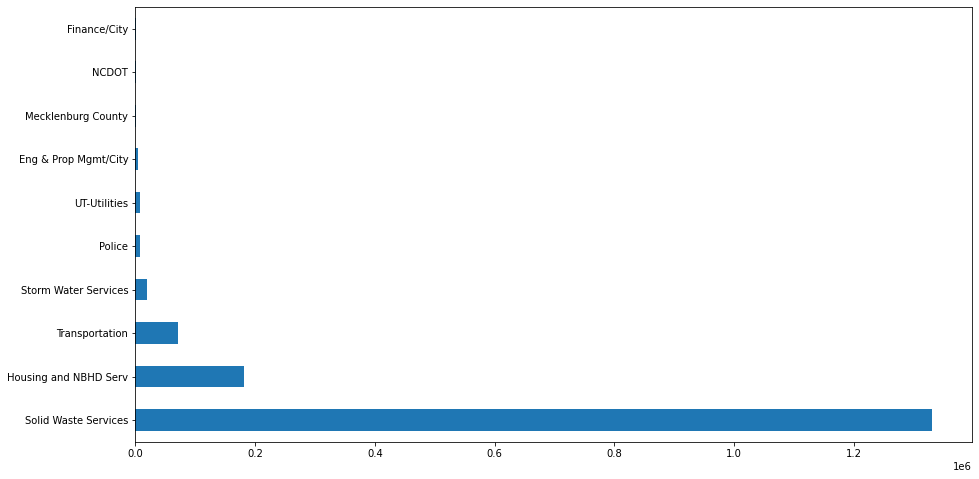

In [10]:
# create barplot of the departments involved in 'Request types'
df['DEPARTMENT'].value_counts().head(10).plot(kind='barh', figsize=(15,8))

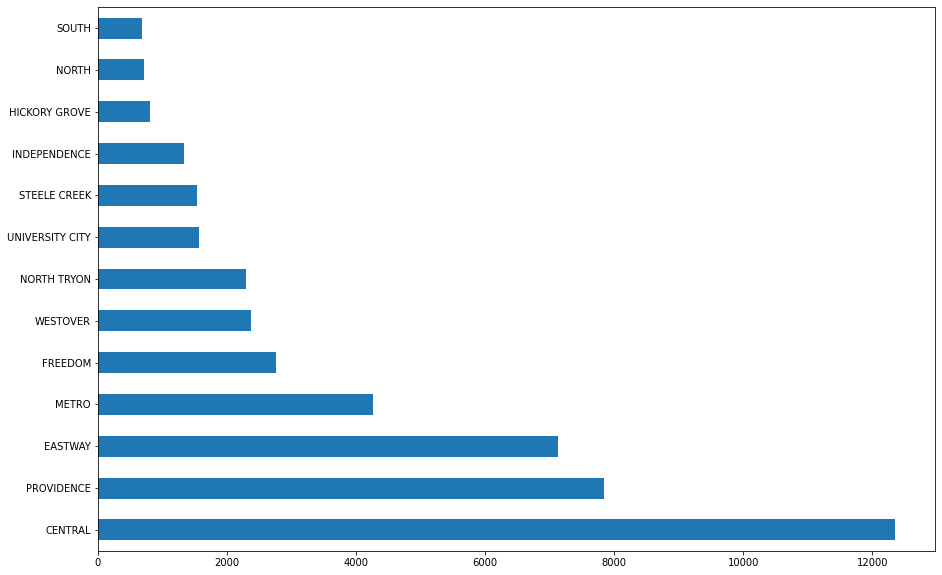

In [11]:
# Barplot of CMPD divisions in relation to request types
df['CMPD_DIVISION'].value_counts().head(30).plot(kind='barh', figsize=(15,10))

# SHAPE FILE

# Dowloaded a 'census block' shape file 
<br> 1. Import the shape file & remove unwanted columns </br
<br> 2. Graph the shape file and see how it looks </br>

**WHAT IS GEOID: it is an FIPS code**

    [FIPS](https://www.census.gov/programs-surveys/geography/guidance/geo-identifiers.html)

<br> Ignore 14000 US - it just means the type of Census Data</br>
<br>**The first 2 digits** = State = 37 For NC</br>
<br>**The next 3 digits** = County = 119 for Mecklenburg County</br>
<br>**The next 6 digits** = Tract - which can be further divided into "Block Groups" - and those are divided into "Blocks"</br>
<br>T**he last digit** = Block Number</br>


## **BLOCK GROUPS EXPERIMENT**

<br> Bringing in data from the US Census on Mecklenburg county Block Groups</br>

<br> This is the shape file and I am calling this as 'bg' </br>

<br> Read the shape file into Jupyter with Geopandas</br>

In [12]:
# population block group data from census reporter
bg = gpd.read_file('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/block_groups/acs2019_5yr_B01003_15000US371190057131.geojson')

In [13]:
bg.head()

,geoid,name,B01003001,"B01003001, Error",geometry
0,05000US37119,"Mecklenburg County, NC",1074475.0,0.0,"MULTIPOLYGON (((-80.75291 35.41560, -80.75241 ..."
1,15000US371190001001,"Block Group 1, Mecklenburg, NC",1714.0,278.0,"MULTIPOLYGON (((-80.85519 35.22279, -80.85444 ..."
2,15000US371190001002,"Block Group 2, Mecklenburg, NC",2095.0,315.0,"MULTIPOLYGON (((-80.84843 35.23180, -80.84739 ..."
3,15000US371190001003,"Block Group 3, Mecklenburg, NC",1270.0,286.0,"MULTIPOLYGON (((-80.84507 35.22902, -80.84448 ..."
4,15000US371190001004,"Block Group 4, Mecklenburg, NC",83.0,81.0,"MULTIPOLYGON (((-80.84226 35.22777, -80.84194 ..."


In [14]:
# trim the data - getting rid of the 'error' column
bg = bg[['geoid','B01003001','geometry']]

# rename the columns
bg.columns = ['FIPS','TotalPop','geometry']

In [15]:
bg.tail()

,FIPS,TotalPop,geometry
551,15000US371190064071,1420.0,"MULTIPOLYGON (((-80.86861 35.45820, -80.86726 ..."
552,15000US371190064072,2587.0,"MULTIPOLYGON (((-80.86659 35.44755, -80.86649 ..."
553,15000US371199801001,0.0,"MULTIPOLYGON (((-80.97112 35.22719, -80.97104 ..."
554,15000US371199802001,0.0,"MULTIPOLYGON (((-80.95757 35.09339, -80.95738 ..."
555,15000US371199803001,28.0,"MULTIPOLYGON (((-80.84358 35.21911, -80.84200 ..."


In [16]:
# fix FIPS code - removing the first part '15000US' is of no value
bg['FIPS'] = bg['FIPS'].str.replace('15000US','')
bg.tail()

,FIPS,TotalPop,geometry
551,371190064071,1420.0,"MULTIPOLYGON (((-80.86861 35.45820, -80.86726 ..."
552,371190064072,2587.0,"MULTIPOLYGON (((-80.86659 35.44755, -80.86649 ..."
553,371199801001,0.0,"MULTIPOLYGON (((-80.97112 35.22719, -80.97104 ..."
554,371199802001,0.0,"MULTIPOLYGON (((-80.95757 35.09339, -80.95738 ..."
555,371199803001,28.0,"MULTIPOLYGON (((-80.84358 35.21911, -80.84200 ..."


In [17]:
# sort by total pop - looking for 0 population zones
bg.sort_values(by='TotalPop').head(20)

,FIPS,TotalPop,geometry
554,371199802001,0.0,"MULTIPOLYGON (((-80.95757 35.09339, -80.95738 ..."
553,371199801001,0.0,"MULTIPOLYGON (((-80.97112 35.22719, -80.97104 ..."
555,371199803001,28.0,"MULTIPOLYGON (((-80.84358 35.21911, -80.84200 ..."
351,371190056172,31.0,"MULTIPOLYGON (((-80.71040 35.23284, -80.71038 ..."
4,371190001004,83.0,"MULTIPOLYGON (((-80.84226 35.22777, -80.84194 ..."
215,371190038023,112.0,"MULTIPOLYGON (((-80.89467 35.19242, -80.89452 ..."
272,371190053051,294.0,"MULTIPOLYGON (((-80.79489 35.26672, -80.79487 ..."
416,371190058313,328.0,"MULTIPOLYGON (((-80.85309 35.08633, -80.85309 ..."
75,371190019123,335.0,"MULTIPOLYGON (((-80.73666 35.22608, -80.73662 ..."
63,371190018012,353.0,"MULTIPOLYGON (((-80.80725 35.20432, -80.80645 ..."


In [18]:
# delete less than 100 population geographies - trying to stick to 'populated areas'
bg = bg[bg['TotalPop']>100]

In [19]:
# get the layers into a web mercator projection
# reproject to web mercator
bg = bg.to_crs(epsg=4326)

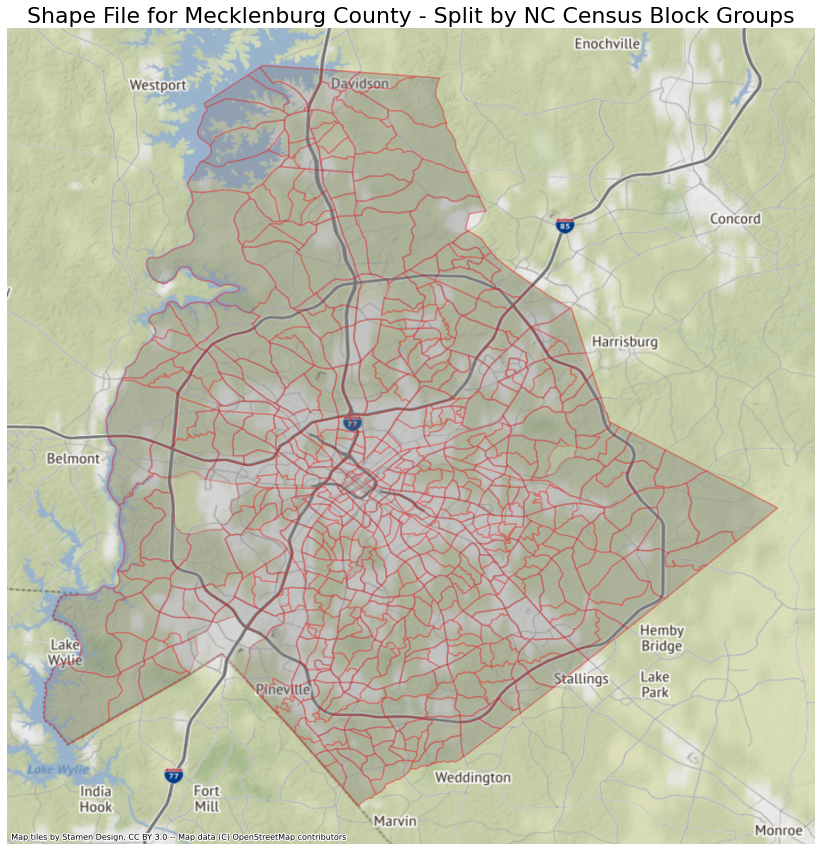

In [20]:
# Checking out what the plot looks like
fig, ax = plt.subplots(figsize=(15,15))

bg.plot(ax=ax,
         color='grey', 
         edgecolor='red',
         lw=1.5,
         alpha=0.2)

# no axis
ax.axis('off')
ax.set_title('Shape File for Mecklenburg County - Split by NC Census Block Groups',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs=bg.crs.to_string())

# **CONVERT OUR 311 CALL DATA TO A GEO PANDAS DATAFRAME** 

### <br> I am calling our 311 data frame = Three11 (this is the new geopandas data frame) </br>

<br> Here we are going to create a 'geometry' column and link it to the above shapefile that contains the 'block groups' for Mecklenburg County

### **Coordinate systems and Projections**

Coordinate reference systems represent how our data as two dimensional (planar) relates to actual places on earth. It is the glue that holds the attributes to their respective locations. Geodataframes has .crs attribute that can give you the original CRS used in the data. It is easy to transform and project these coordinates. However, to perform projections, it is necessary to have the same CRS in order to carry out geographic analysis and get the right values out the analysis. The countries, cities and rivers have the same CRS. Let us check them.

In [21]:
df.head()

,X,Y,OBJECTID,DEPARTMENT,DIVISION,REQUEST_NO,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,TITLE,CMPD_DIVISION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,STREET_DIRECTION,STREET_NAME,STREET_TYPE,CITY,STATE,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,COUNCIL_DISTRICT,GlobalID,PID,Shape
0,1.458251e+06,508075.000119,1,Solid Waste Services,Sanitation,6402056,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:25:00+00,N,NON_RECYCLABLE ITEMS,NaN,215.0,3601.0,NaN,KNAPDALE,LN,CHARLOTTE,NC,28226.0,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",1458251.0,508075.0,35.132444,-80.812089,NaN,{35439C7B-D8E4-4296-9119-8673B1D5A7C8},20904304,NaN
1,1.468687e+06,587225.999953,2,Housing and NBHD Serv,311 Partner Liaison,6402064,2017,05-Nov,UTILITY VERIFICATION LTR,2016/11/07 14:28:00+00,N,UTILITY VERIFICATION LTR,NaN,265.0,4124.0,NaN,SILVERMERE,WY,CHARLOTTE,NC,28269.0,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",1468687.0,587226.0,35.350408,-80.781941,NaN,{3B4A2DC0-8886-4E8E-95E6-4F426C4E08E2},02731251,NaN
2,1.471481e+06,562512.999839,3,Solid Waste Services,Sanitation,6402082,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:34:00+00,N,Non-recyclable Items,NaN,103.0,523.0,NaN,GRAHAM MEADOW,DR,CHARLOTTE,NC,28213.0,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",1471481.0,562513.0,35.282654,-80.771094,NaN,{C3E4CF76-7630-4356-8216-428445A0903F},08917486,NaN
3,1.438992e+06,568604.000124,4,Solid Waste Services,Sanitation,6402103,2017,05-Nov,MISSED RECYCLING,2016/11/07 14:41:00+00,N,MISSED RECYCLING,NaN,158.0,1801.0,NaN,CRANDON,DR,CHARLOTTE,NC,28216.0,"1801 CRANDON DR, CHARLOTTE, NC 28216",1438992.0,568604.0,35.297745,-80.880327,NaN,{FC3B4CD8-1131-42B4-A37E-8CA448855B24},03925515,NaN
4,NaN,NaN,5,Transit,Transit/Operations,6402111,2017,05-Nov,CITIZEN FEEDBACK,2016/11/07 14:44:00+00,N,CITIZEN FEEDBACK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,{E0166346-2381-40E1-80A0-2ECA4FB6CB27},NaN,NaN


In [22]:
# convert our 311 calls dataframe (called df) into a geodataframe - i have renamed this dataframe to three11  
# basically we need to set a Coordinate reference systems (CRS).	Since we already have Longitude and Latitude in our 311 data set, we are good to go
three11 = gpd.GeoDataFrame(df, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE))

In [23]:
# get the layers into a web mercator projection
# reproject to web mercator
three11 = three11.to_crs(epsg=4326)

In [24]:
three11.head()

,X,Y,OBJECTID,DEPARTMENT,DIVISION,REQUEST_NO,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,TITLE,CMPD_DIVISION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,STREET_DIRECTION,STREET_NAME,STREET_TYPE,CITY,STATE,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,COUNCIL_DISTRICT,GlobalID,PID,Shape,geometry
0,1.458251e+06,508075.000119,1,Solid Waste Services,Sanitation,6402056,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:25:00+00,N,NON_RECYCLABLE ITEMS,NaN,215.0,3601.0,NaN,KNAPDALE,LN,CHARLOTTE,NC,28226.0,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",1458251.0,508075.0,35.132444,-80.812089,NaN,{35439C7B-D8E4-4296-9119-8673B1D5A7C8},20904304,NaN,POINT (-80.81209 35.13244)
1,1.468687e+06,587225.999953,2,Housing and NBHD Serv,311 Partner Liaison,6402064,2017,05-Nov,UTILITY VERIFICATION LTR,2016/11/07 14:28:00+00,N,UTILITY VERIFICATION LTR,NaN,265.0,4124.0,NaN,SILVERMERE,WY,CHARLOTTE,NC,28269.0,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",1468687.0,587226.0,35.350408,-80.781941,NaN,{3B4A2DC0-8886-4E8E-95E6-4F426C4E08E2},02731251,NaN,POINT (-80.78194 35.35041)
2,1.471481e+06,562512.999839,3,Solid Waste Services,Sanitation,6402082,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:34:00+00,N,Non-recyclable Items,NaN,103.0,523.0,NaN,GRAHAM MEADOW,DR,CHARLOTTE,NC,28213.0,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",1471481.0,562513.0,35.282654,-80.771094,NaN,{C3E4CF76-7630-4356-8216-428445A0903F},08917486,NaN,POINT (-80.77109 35.28265)
3,1.438992e+06,568604.000124,4,Solid Waste Services,Sanitation,6402103,2017,05-Nov,MISSED RECYCLING,2016/11/07 14:41:00+00,N,MISSED RECYCLING,NaN,158.0,1801.0,NaN,CRANDON,DR,CHARLOTTE,NC,28216.0,"1801 CRANDON DR, CHARLOTTE, NC 28216",1438992.0,568604.0,35.297745,-80.880327,NaN,{FC3B4CD8-1131-42B4-A37E-8CA448855B24},03925515,NaN,POINT (-80.88033 35.29775)
4,NaN,NaN,5,Transit,Transit/Operations,6402111,2017,05-Nov,CITIZEN FEEDBACK,2016/11/07 14:44:00+00,N,CITIZEN FEEDBACK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,{E0166346-2381-40E1-80A0-2ECA4FB6CB27},NaN,NaN,POINT EMPTY


In [25]:
# convert lat/lon to floats
three11.LONGITUDE = three11.LONGITUDE.astype('float')
three11.LATITUDE = three11.LATITUDE.astype('float')

In [26]:
# drop the unmapped rows - anything that has a longitude of 0 should be removed
three11 = three11[three11.LONGITUDE!=0]
three11 = three11[three11.LATITUDE!=0]

In [27]:
three11.head()

,X,Y,OBJECTID,DEPARTMENT,DIVISION,REQUEST_NO,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,TITLE,CMPD_DIVISION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,STREET_DIRECTION,STREET_NAME,STREET_TYPE,CITY,STATE,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,COUNCIL_DISTRICT,GlobalID,PID,Shape,geometry
0,1.458251e+06,508075.000119,1,Solid Waste Services,Sanitation,6402056,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:25:00+00,N,NON_RECYCLABLE ITEMS,NaN,215.0,3601.0,NaN,KNAPDALE,LN,CHARLOTTE,NC,28226.0,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",1458251.0,508075.0,35.132444,-80.812089,NaN,{35439C7B-D8E4-4296-9119-8673B1D5A7C8},20904304,NaN,POINT (-80.81209 35.13244)
1,1.468687e+06,587225.999953,2,Housing and NBHD Serv,311 Partner Liaison,6402064,2017,05-Nov,UTILITY VERIFICATION LTR,2016/11/07 14:28:00+00,N,UTILITY VERIFICATION LTR,NaN,265.0,4124.0,NaN,SILVERMERE,WY,CHARLOTTE,NC,28269.0,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",1468687.0,587226.0,35.350408,-80.781941,NaN,{3B4A2DC0-8886-4E8E-95E6-4F426C4E08E2},02731251,NaN,POINT (-80.78194 35.35041)
2,1.471481e+06,562512.999839,3,Solid Waste Services,Sanitation,6402082,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:34:00+00,N,Non-recyclable Items,NaN,103.0,523.0,NaN,GRAHAM MEADOW,DR,CHARLOTTE,NC,28213.0,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",1471481.0,562513.0,35.282654,-80.771094,NaN,{C3E4CF76-7630-4356-8216-428445A0903F},08917486,NaN,POINT (-80.77109 35.28265)
3,1.438992e+06,568604.000124,4,Solid Waste Services,Sanitation,6402103,2017,05-Nov,MISSED RECYCLING,2016/11/07 14:41:00+00,N,MISSED RECYCLING,NaN,158.0,1801.0,NaN,CRANDON,DR,CHARLOTTE,NC,28216.0,"1801 CRANDON DR, CHARLOTTE, NC 28216",1438992.0,568604.0,35.297745,-80.880327,NaN,{FC3B4CD8-1131-42B4-A37E-8CA448855B24},03925515,NaN,POINT (-80.88033 35.29775)
4,NaN,NaN,5,Transit,Transit/Operations,6402111,2017,05-Nov,CITIZEN FEEDBACK,2016/11/07 14:44:00+00,N,CITIZEN FEEDBACK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,{E0166346-2381-40E1-80A0-2ECA4FB6CB27},NaN,NaN,POINT EMPTY


## **GEO-PANDAS DATAFRAM SETUP of the 311 Calls data is COMPLETE.** 

## <br> Now we can filter our 311 data set and decide what we want to see mapped

## Plan: 
## <br> 1. remove missing values 
## <br> 2. filter REQUEST TYPE and put them into their own df 

In [28]:
# Need to drop the redundant columns, checking head()
three11.head()

,X,Y,OBJECTID,DEPARTMENT,DIVISION,REQUEST_NO,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,RECEIVED_DATE,INTERNAL_FIELD_OBSERVATION,TITLE,CMPD_DIVISION,NEIGHBORHOOD_PROFILE_AREA,BLOCK_NO,STREET_DIRECTION,STREET_NAME,STREET_TYPE,CITY,STATE,ZIP_CODE,FULL_ADDRESS,X_COORD,Y_COORD,LATITUDE,LONGITUDE,COUNCIL_DISTRICT,GlobalID,PID,Shape,geometry
0,1.458251e+06,508075.000119,1,Solid Waste Services,Sanitation,6402056,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:25:00+00,N,NON_RECYCLABLE ITEMS,NaN,215.0,3601.0,NaN,KNAPDALE,LN,CHARLOTTE,NC,28226.0,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",1458251.0,508075.0,35.132444,-80.812089,NaN,{35439C7B-D8E4-4296-9119-8673B1D5A7C8},20904304,NaN,POINT (-80.81209 35.13244)
1,1.468687e+06,587225.999953,2,Housing and NBHD Serv,311 Partner Liaison,6402064,2017,05-Nov,UTILITY VERIFICATION LTR,2016/11/07 14:28:00+00,N,UTILITY VERIFICATION LTR,NaN,265.0,4124.0,NaN,SILVERMERE,WY,CHARLOTTE,NC,28269.0,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",1468687.0,587226.0,35.350408,-80.781941,NaN,{3B4A2DC0-8886-4E8E-95E6-4F426C4E08E2},02731251,NaN,POINT (-80.78194 35.35041)
2,1.471481e+06,562512.999839,3,Solid Waste Services,Sanitation,6402082,2017,05-Nov,NON_RECYCLABLE ITEMS,2016/11/07 14:34:00+00,N,Non-recyclable Items,NaN,103.0,523.0,NaN,GRAHAM MEADOW,DR,CHARLOTTE,NC,28213.0,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",1471481.0,562513.0,35.282654,-80.771094,NaN,{C3E4CF76-7630-4356-8216-428445A0903F},08917486,NaN,POINT (-80.77109 35.28265)
3,1.438992e+06,568604.000124,4,Solid Waste Services,Sanitation,6402103,2017,05-Nov,MISSED RECYCLING,2016/11/07 14:41:00+00,N,MISSED RECYCLING,NaN,158.0,1801.0,NaN,CRANDON,DR,CHARLOTTE,NC,28216.0,"1801 CRANDON DR, CHARLOTTE, NC 28216",1438992.0,568604.0,35.297745,-80.880327,NaN,{FC3B4CD8-1131-42B4-A37E-8CA448855B24},03925515,NaN,POINT (-80.88033 35.29775)
4,NaN,NaN,5,Transit,Transit/Operations,6402111,2017,05-Nov,CITIZEN FEEDBACK,2016/11/07 14:44:00+00,N,CITIZEN FEEDBACK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,{E0166346-2381-40E1-80A0-2ECA4FB6CB27},NaN,NaN,POINT EMPTY


In [29]:
# Getting a list of all column names
list(three11)

['X',
 'Y',
 'OBJECTID',
 'DEPARTMENT',
 'DIVISION',
 'REQUEST_NO',
 'FISCAL_YEAR',
 'FISCAL_MONTH',
 'REQUEST_TYPE',
 'RECEIVED_DATE',
 'INTERNAL_FIELD_OBSERVATION',
 'TITLE',
 'CMPD_DIVISION',
 'NEIGHBORHOOD_PROFILE_AREA',
 'BLOCK_NO',
 'STREET_DIRECTION',
 'STREET_NAME',
 'STREET_TYPE',
 'CITY',
 'STATE',
 'ZIP_CODE',
 'FULL_ADDRESS',
 'X_COORD',
 'Y_COORD',
 'LATITUDE',
 'LONGITUDE',
 'COUNCIL_DISTRICT',
 'GlobalID',
 'PID',
 'Shape',
 'geometry']

In [30]:
# create a list of columns to keep
columns_to_keep =  ['OBJECTID',
                    'DEPARTMENT',
                    'DIVISION',
                    'REQUEST_NO',
                    'FISCAL_YEAR',
                    'FISCAL_MONTH',
                    'REQUEST_TYPE',
                    'CMPD_DIVISION',
                    'FULL_ADDRESS',
                    'ZIP_CODE',
                    'X_COORD',
                    'Y_COORD',
                    'LATITUDE',
                    'LONGITUDE',
                    'geometry']

In [31]:
# redefine the gdf with only columns to keep
three11 = three11[columns_to_keep]

In [32]:
three11.head()

,OBJECTID,DEPARTMENT,DIVISION,REQUEST_NO,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,CMPD_DIVISION,FULL_ADDRESS,ZIP_CODE,X_COORD,Y_COORD,LATITUDE,LONGITUDE,geometry
0,1,Solid Waste Services,Sanitation,6402056,2017,05-Nov,NON_RECYCLABLE ITEMS,NaN,"3601 KNAPDALE LN, CHARLOTTE, NC 28226",28226.0,1458251.0,508075.0,35.132444,-80.812089,POINT (-80.81209 35.13244)
1,2,Housing and NBHD Serv,311 Partner Liaison,6402064,2017,05-Nov,UTILITY VERIFICATION LTR,NaN,"4124 SILVERMERE WY, CHARLOTTE, NC 28269",28269.0,1468687.0,587226.0,35.350408,-80.781941,POINT (-80.78194 35.35041)
2,3,Solid Waste Services,Sanitation,6402082,2017,05-Nov,NON_RECYCLABLE ITEMS,NaN,"523 GRAHAM MEADOW DR, CHARLOTTE, NC 28213",28213.0,1471481.0,562513.0,35.282654,-80.771094,POINT (-80.77109 35.28265)
3,4,Solid Waste Services,Sanitation,6402103,2017,05-Nov,MISSED RECYCLING,NaN,"1801 CRANDON DR, CHARLOTTE, NC 28216",28216.0,1438992.0,568604.0,35.297745,-80.880327,POINT (-80.88033 35.29775)
4,5,Transit,Transit/Operations,6402111,2017,05-Nov,CITIZEN FEEDBACK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT EMPTY


In [33]:
# Find columns with Na's
three11.isna().sum()

# Delete columns with NaN
three11 = three11.drop(['DIVISION', 'REQUEST_NO', 'CMPD_DIVISION', 'FULL_ADDRESS'], axis = 1)

In [34]:
# Actually drop the Na's
three11 = three11.dropna()

In [35]:
# Double check is Na's have been removed
three11.isna().sum()

OBJECTID        0
DEPARTMENT      0
FISCAL_YEAR     0
FISCAL_MONTH    0
REQUEST_TYPE    0
ZIP_CODE        0
X_COORD         0
Y_COORD         0
LATITUDE        0
LONGITUDE       0
geometry        0
dtype: int64

# **Experimenting with filtering Request Type**

# Filter to find Potholes & Streetlight repair requests

In [36]:
# Top 30 311 Requests


top_30 = three11['REQUEST_TYPE'].value_counts().head(30)
print(top_30)

NON_RECYCLABLE ITEMS         820199
RECYCLABLE ITEMS             196945
HNS HEALTH AND SANITATION     77723
CART REPAIR-GARBAGE           36238
MISSED RECYCLING              27098
SW DOCUMENT GARBAGE           26405
311 DOCUMENT                  22379
SW DOCUMENT RECYCLING         17706
CDOT STREETLIGHT REPAIR       16627
CART ISSUE/MISSING CART       14850
TIRES                         13440
SW DOCUMENT YARD WASTE        13054
DEAD ANIMAL COLLECTION        10701
CART DELIVERY RECYCLING       10385
ZONING/COMPLAINT/ INSPECT      9994
CART(S) DEL- NEW BUILD         9901
CART REPAIR-RECYCLE            9852
CART ONLY DELIVER-GARB         9794
COMPLAINT                      8486
HNS HOUSING                    8161
CART PURCHASE 2ND-GARBAGE      8002
ZON GENERAL INFO  INQUIRY      7894
MISSED GARBAGE                 7127
PARKING ON LAWN WORKDAYS       6812
SWS LIAISON                    5277
CDOT POTHOLE REPAIR            5214
SW DOCUMENT BULKY ITEMS        5130
MISSED YARD WASTE           

In [37]:
# Filtering all Pot Hole repair requests


pot_holes = (three11['REQUEST_TYPE'] == 'CDOT POTHOLE REPAIR')

# pt_df = pd.DataFrame.from_records(pot_holes)



# We can view the filtered results by:
# three11[pot_holes]

# OR

# Use .loc - after the first argument (which is the filter), we can specify what columns we want to be returned
# test_var = three11.loc[pot_holes, 'geometry']
# print(test_var )

In [38]:
# Filtering all Streetlight repair requests

st_light_repair = (three11['REQUEST_TYPE'] == 'CDOT STREETLIGHT REPAIR')

# st_df = pd.DataFrame.from_records(st_light_repair)

In [39]:
# View the 311 calls data set:

# We have removed missing values, 
# removed columns we dont need,
# this data frame is also a geo pandas dataframe - the geometry column is based on long/lat

three11.head()

,OBJECTID,DEPARTMENT,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,ZIP_CODE,X_COORD,Y_COORD,LATITUDE,LONGITUDE,geometry
0,1,Solid Waste Services,2017,05-Nov,NON_RECYCLABLE ITEMS,28226.0,1458251.0,508075.0,35.132444,-80.812089,POINT (-80.81209 35.13244)
1,2,Housing and NBHD Serv,2017,05-Nov,UTILITY VERIFICATION LTR,28269.0,1468687.0,587226.0,35.350408,-80.781941,POINT (-80.78194 35.35041)
2,3,Solid Waste Services,2017,05-Nov,NON_RECYCLABLE ITEMS,28213.0,1471481.0,562513.0,35.282654,-80.771094,POINT (-80.77109 35.28265)
3,4,Solid Waste Services,2017,05-Nov,MISSED RECYCLING,28216.0,1438992.0,568604.0,35.297745,-80.880327,POINT (-80.88033 35.29775)
5,6,Finance/City,2017,05-Nov,CWP REQUEST,28208.0,1439454.0,552715.0,35.254120,-80.877772,POINT (-80.87777 35.25412)


In [40]:
# get the bounding box coordinates for the 311 calls data
minx, miny, maxx, maxy = three11.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)


-85.56829116
-80.55847037
35.01303165
35.51843084


# MAP TESTING: 

# We have our data filtered. Now apply these data points to our Shapefile



In [41]:
! pip install mapclassify

import mapclassify

! pip install contextily
import contextily as ctx

! pip install xyzservices
import xyzservices.providers as xyz

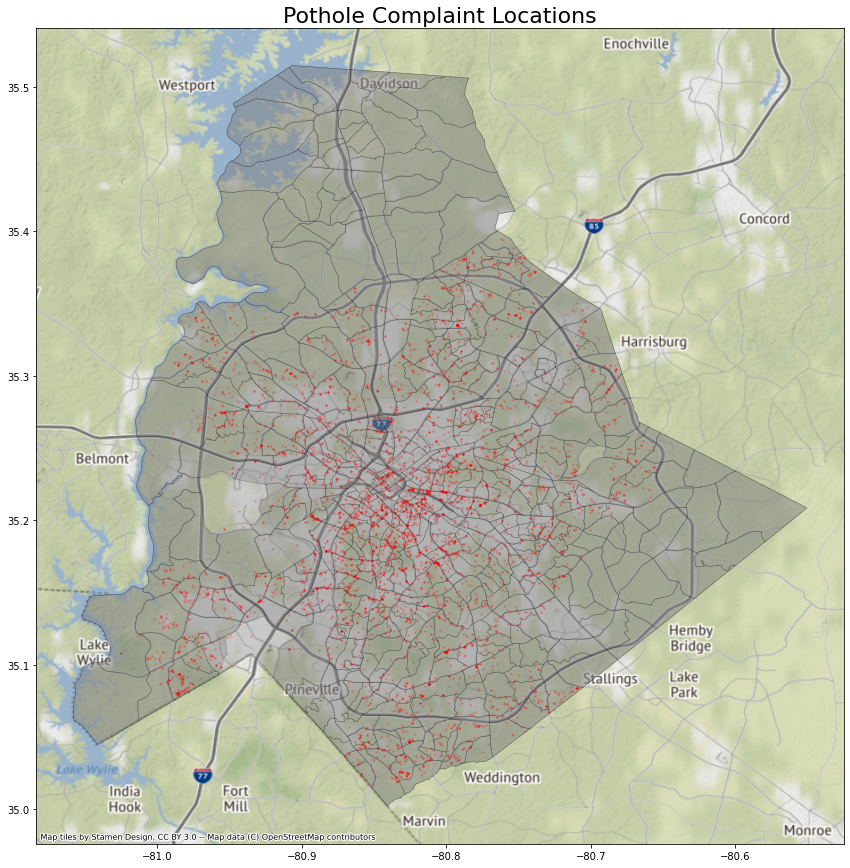

In [42]:
# Test Mapping Pothole Complaints to the CENSUS BLOCK GROUPS Shape File
# We will attempt Layered Mapping

# set up the plot canvas with plt.subplots in one column, one row
fig, ax = plt.subplots(1,1,figsize=(15, 15))

# Plot 1
# Map block groups GeoPandas Frame is called 'bg'
bg.plot(ax=ax, # this puts it in the ax plot
        color='grey', 
        edgecolor='black',
        alpha=0.3,
        lw=0.5)

plt.title('Pothole Complaint Locations',fontsize=22)

# Plot 2
# Map Potholes
three11.loc[pot_holes].plot(ax=ax, 
                            color='red',
                            markersize=2,
                            alpha=0.2)

# use the bounding box coordinates to set the x and y limits
# ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
# ax.set_ylim(miny - 1000, maxy + 1000)



# no axis
# ax.axis('off')


# add a basemap
ctx.add_basemap(ax, crs=bg.crs.to_string())

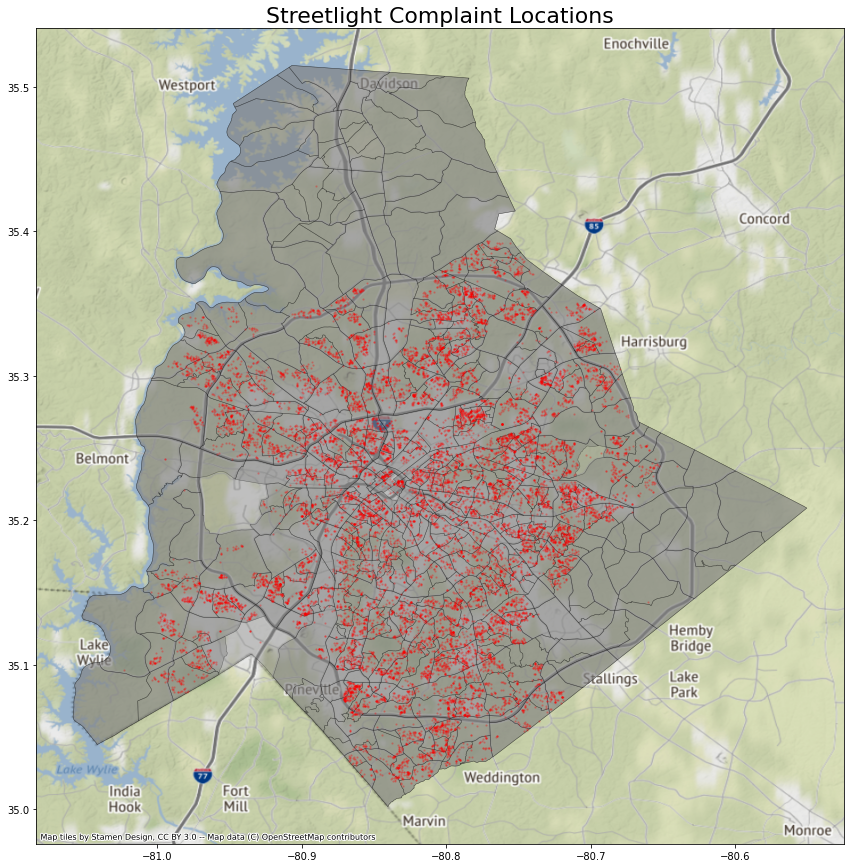

In [43]:
# Test Mapping Streetlight Repair Complaints to the CENSUS BLOCK GROUPS Shape File
# We will attempt Layered Mapping


# set up the plot canvas with plt.subplots in one column, one row
fig, ax = plt.subplots(1,1,figsize=(15, 15))

# Plot 1
# Map block groups GeoPandas Frame is called 'bg'
bg.plot(ax=ax,
        color='grey', 
        edgecolor='black',
        alpha=0.4,
        lw=0.5)

plt.title('Streetlight Complaint Locations',fontsize=22)


# Plot 2
# Map Streetlight complaints
three11.loc[st_light_repair].plot(ax=ax, 
                            color='red',
                            markersize=2,
                            alpha=0.2)

# use the bounding box coordinates to set the x and y limits
# ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
# ax.set_ylim(miny - 1000, maxy + 1000)



# no axis
# ax.axis('off')


# add a basemap
ctx.add_basemap(ax, crs=bg.crs.to_string())


In [44]:
! pip install pygeos
import pygeos

In [45]:
! pip install rtree
import rtree

# Combining the Shape File & 311 Data set
* We will need to do this if we want to make Chloropeth maps

In [46]:
# Spatial join of both map layers

joined_data = gpd.sjoin(three11, bg, how='left')
joined_data.head()

,OBJECTID,DEPARTMENT,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,ZIP_CODE,X_COORD,Y_COORD,LATITUDE,LONGITUDE,geometry,index_right,FIPS,TotalPop
0,1,Solid Waste Services,2017,05-Nov,NON_RECYCLABLE ITEMS,28226.0,1458251.0,508075.0,35.132444,-80.812089,POINT (-80.81209 35.13244),151.0,371190030071,832.0
0,1,Solid Waste Services,2017,05-Nov,NON_RECYCLABLE ITEMS,28226.0,1458251.0,508075.0,35.132444,-80.812089,POINT (-80.81209 35.13244),0.0,05000US37119,1074475.0
1,2,Housing and NBHD Serv,2017,05-Nov,UTILITY VERIFICATION LTR,28269.0,1468687.0,587226.0,35.350408,-80.781941,POINT (-80.78194 35.35041),0.0,05000US37119,1074475.0
1,2,Housing and NBHD Serv,2017,05-Nov,UTILITY VERIFICATION LTR,28269.0,1468687.0,587226.0,35.350408,-80.781941,POINT (-80.78194 35.35041),302.0,371190055132,1161.0
2,3,Solid Waste Services,2017,05-Nov,NON_RECYCLABLE ITEMS,28213.0,1471481.0,562513.0,35.282654,-80.771094,POINT (-80.77109 35.28265),0.0,05000US37119,1074475.0


In [49]:
# Counts of 311 Calls based on FIPS
counts_by_bg = joined_data.FIPS.value_counts().rename_axis('FIPS').reset_index(name='311_Calls_Count')

In [48]:
counts_by_bg.head()

NameError: ignored

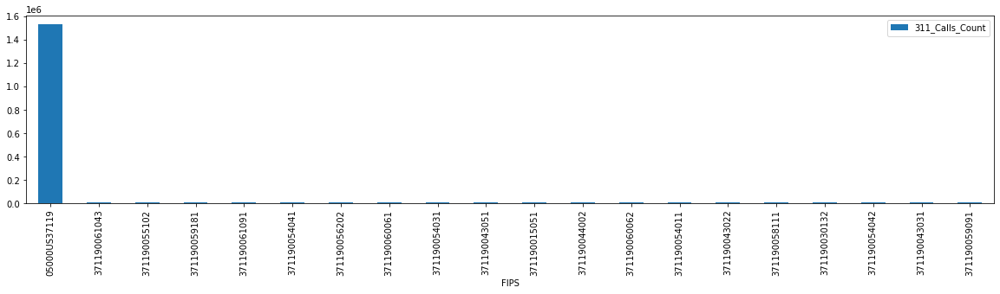

In [50]:
# bar chart of top 20 geographies
counts_by_bg[:20].plot.bar(figsize=(20,4),
                             x='FIPS',
                             y='311_Calls_Count')

In [51]:
# join the summary table back to the gdf
bg = bg.merge(counts_by_bg, on='FIPS')

In [52]:
bg.head()

,FIPS,TotalPop,geometry,311_Calls_Count
0,05000US37119,1074475.0,"MULTIPOLYGON (((-80.75291 35.41560, -80.75241 ...",1532259
1,371190001001,1714.0,"MULTIPOLYGON (((-80.85519 35.22279, -80.85444 ...",919
2,371190001002,2095.0,"MULTIPOLYGON (((-80.84843 35.23180, -80.84739 ...",721
3,371190001003,1270.0,"MULTIPOLYGON (((-80.84507 35.22902, -80.84448 ...",527
4,371190001005,735.0,"MULTIPOLYGON (((-80.85206 35.22009, -80.85121 ...",525



# **Graphing the number of 311 calls**



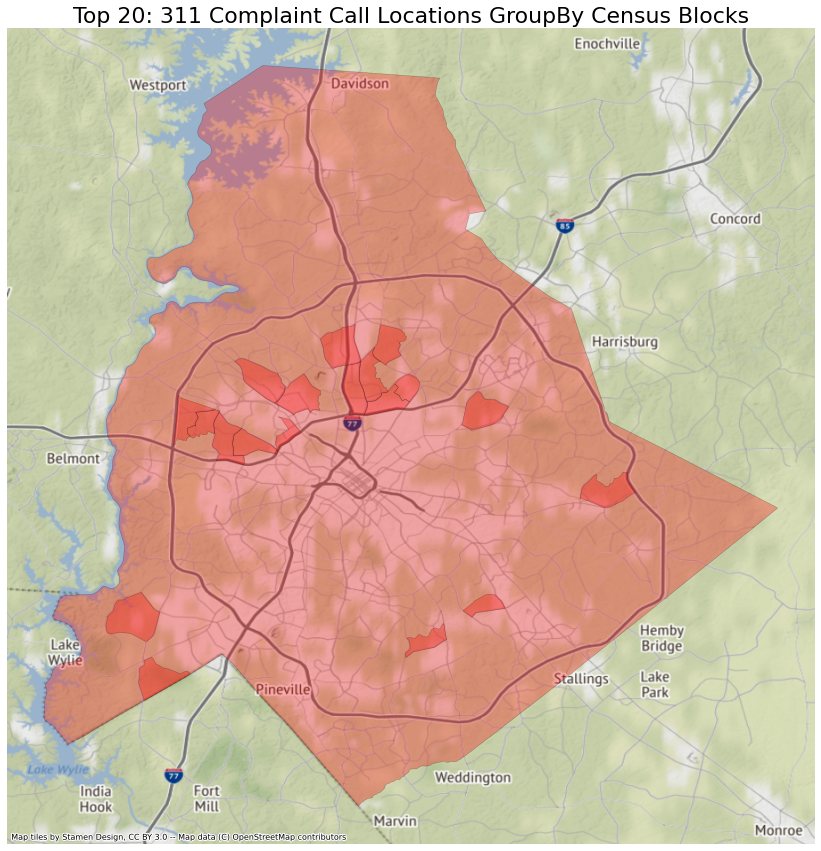

In [54]:
# map the top 20 geographies
fig,ax = plt.subplots(figsize=(15,15))
bg.sort_values(by='311_Calls_Count', ascending=False)[:20].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='black',
                                                                 alpha=0.3,
                                                                 lw = 0.5,
                                                                 legend=True)


# title
ax.set_title('Top 20: 311 Complaint Call Locations GroupBy Census Blocks', fontsize=22)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax, crs=bg.crs.to_string())

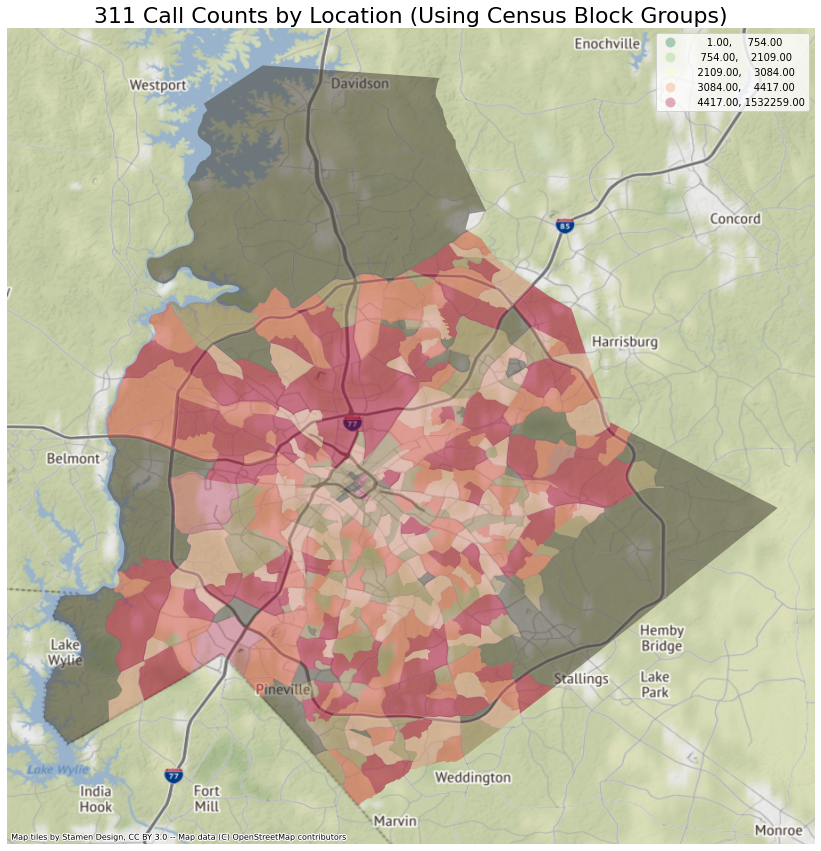

In [56]:

# Chloropeth Mapping
# We are giving a value to each "block group" - it will show the number of calls comming from each block group

fig,ax = plt.subplots(figsize=(15,15))

bg.plot(ax=ax,
        column='311_Calls_Count', # this makes it a choropleth
        alpha=0.3,
        lw=0.8,
        cmap='RdYlGn_r', # a diverging color scheme RdYlGn_r
        scheme='quantiles', # how to break the data into bins
        legend=True) 


ax.axis('off')
ax.set_title('311 Call Counts by Location (Using Census Block Groups)',fontsize=22)
ctx.add_basemap(ax, crs=bg.crs.to_string())



OTHER SHAPE FILES TO CONSIDER

# **IMPORTING OTHER SHAPE FILES**


## Block Groups may be too detailed, so testing other Shape Files

## Will use the Pothole & Streetlight data to see how the spread looks

## ** Test  1**
## (1) Zip Code shape file

In [57]:
# importing shape file called "sphere of influence" - charlotte neighborhoods
zc = gpd.read_file('/content/gdrive/MyDrive/Charlotte 311 Calls Project/Data/zipcode/Zipcode.shp')

In [58]:
zc.head()

,objectid_1,zip,po_name,shape_Leng,shape_Area,geometry
0,1,28269,CHARLOTTE,153090.308851,8.290439e+08,"POLYGON ((1474271.666 605253.751, 1476487.623 ..."
1,2,28075,HARRISBURG,10472.133974,2.431967e+06,"POLYGON ((1489318.124 589639.188, 1489488.625 ..."
2,3,28206,CHARLOTTE,70381.941476,1.956278e+08,"POLYGON ((1464573.491 560419.792, 1464454.104 ..."
3,4,28214,CHARLOTTE,175023.225545,9.583438e+08,"POLYGON ((1414807.123 586940.379, 1414954.627 ..."
4,5,28120,MOUNT HOLLY,7280.707178,1.026388e+06,"POLYGON ((1408118.000 583191.500, 1407986.125 ..."


In [59]:
# get the layers into a web mercator projection
# reproject to web mercator
zc = zc.to_crs(epsg=4326)

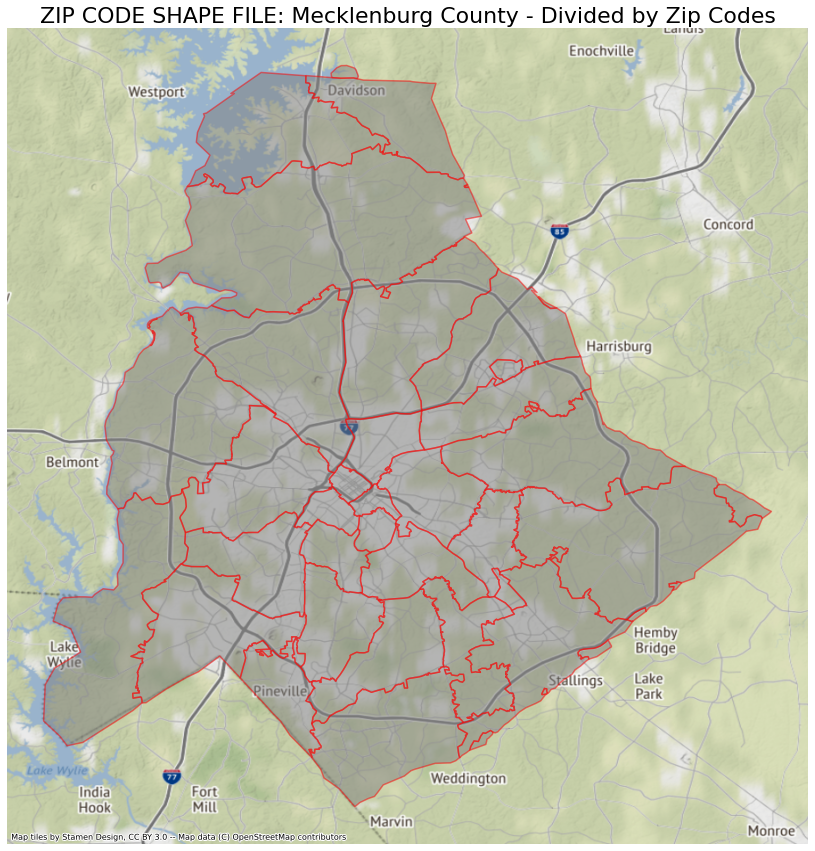

In [60]:
# Checking out what the plot looks like
fig, ax = plt.subplots(figsize=(15,15))

zc.plot(ax=ax,
         color='grey', 
         edgecolor='red',
         lw=1.5,
         alpha=0.5)

# no axis
ax.axis('off')
ax.set_title('ZIP CODE SHAPE FILE: Mecklenburg County - Divided by Zip Codes',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs=bg.crs.to_string())

In [61]:
three11.head()

,OBJECTID,DEPARTMENT,FISCAL_YEAR,FISCAL_MONTH,REQUEST_TYPE,ZIP_CODE,X_COORD,Y_COORD,LATITUDE,LONGITUDE,geometry
0,1,Solid Waste Services,2017,05-Nov,NON_RECYCLABLE ITEMS,28226.0,1458251.0,508075.0,35.132444,-80.812089,POINT (-80.81209 35.13244)
1,2,Housing and NBHD Serv,2017,05-Nov,UTILITY VERIFICATION LTR,28269.0,1468687.0,587226.0,35.350408,-80.781941,POINT (-80.78194 35.35041)
2,3,Solid Waste Services,2017,05-Nov,NON_RECYCLABLE ITEMS,28213.0,1471481.0,562513.0,35.282654,-80.771094,POINT (-80.77109 35.28265)
3,4,Solid Waste Services,2017,05-Nov,MISSED RECYCLING,28216.0,1438992.0,568604.0,35.297745,-80.880327,POINT (-80.88033 35.29775)
5,6,Finance/City,2017,05-Nov,CWP REQUEST,28208.0,1439454.0,552715.0,35.254120,-80.877772,POINT (-80.87777 35.25412)


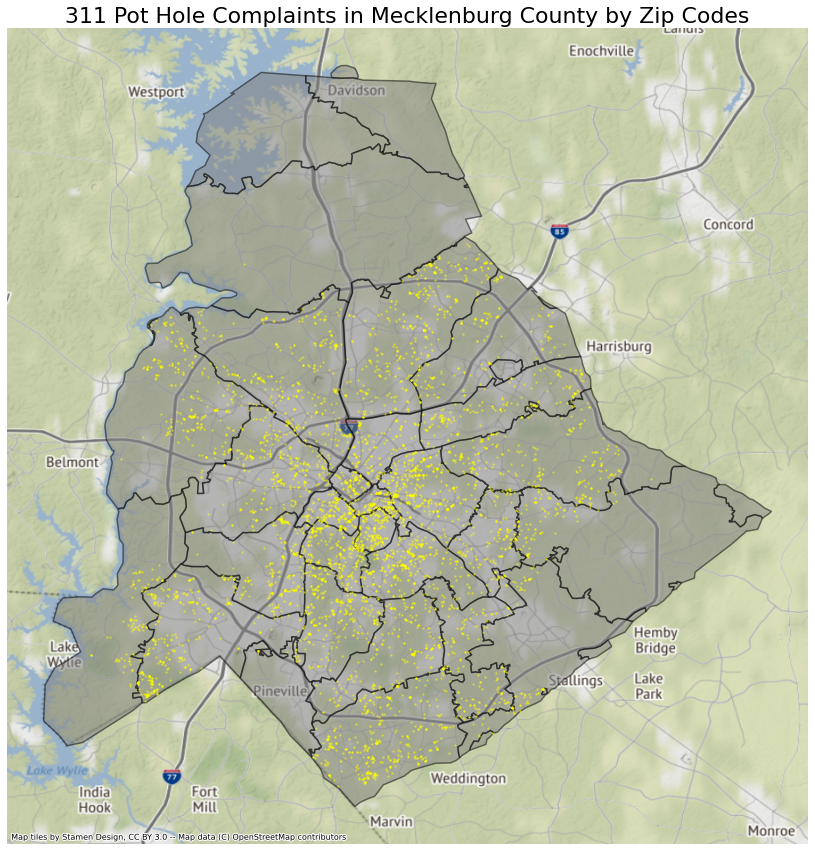

In [62]:
# Layering Pothole repair requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
zc.plot(ax=ax,
         color='grey', 
         edgecolor='black',
         lw=1.5,
         alpha=0.5)

# Plot 2 - Map Potholes
three11.loc[pot_holes].plot(ax=ax, 
                            color='yellow',
                            markersize=2,
                            alpha=0.4)

# no axis
ax.axis('off')
ax.set_title('311 Pot Hole Complaints in Mecklenburg County by Zip Codes',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs=bg.crs.to_string())

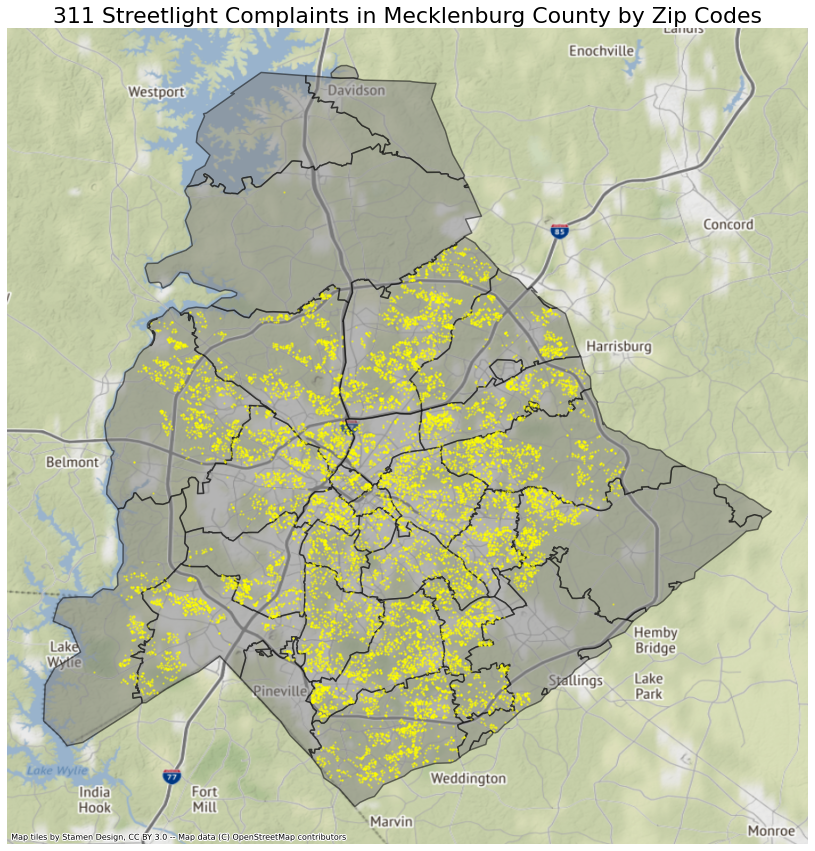

In [63]:
# Layering Streetlight repair requests onto the ZipCode Shape File


fig, ax = plt.subplots(figsize=(15,15))

# Plot 1 - Baselayer (zip code shape file)
zc.plot(ax=ax,
         color='grey', 
         edgecolor='black',
         lw=1.5,
         alpha=0.5)

# Plot 2 - Map Potholes
three11.loc[st_light_repair].plot(ax=ax, 
                            color='yellow',
                            markersize=2,
                            alpha=0.4)

# no axis
ax.axis('off')
ax.set_title('311 Streetlight Complaints in Mecklenburg County by Zip Codes',fontsize=22)

# add a basemap
ctx.add_basemap(ax, crs=bg.crs.to_string())